<a href="https://colab.research.google.com/github/lawsonk16/Remote-Sensing-Datasets/blob/main/FAIR1M/FAIR1M_prep.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Process FAIR1M 
  - 1. Import the whole dataset
  - 2. Explore and understand the dataset through EDA
  - 3. Convert the annotations to COCO style
  - 4. Create a classification dataset

In [ ]:
from matplotlib import pyplot as plt

import sys
notebook_folders = ['/content/drive/MyDrive/Colab Notebooks/scripts/']

for folder in notebook_folders:
    sys.path.append(folder)

from coco_utils.coco_help import *
from coco_data.fair1m_coco import *

## 1. Dataset Import

In [ ]:
# copy the whole folder with original organization
! cp -r '/content/drive/MyDrive/Colab Notebooks/SCHOOL/Final Project/Data/FAIR1M/ISPRS Benchmark/' .

In [ ]:
# unzip the test data

# ! unzip -q '/content/ISPRS Benchmark/test/images.zip' -d '/content/ISPRS Benchmark/test/'
# os.remove('/content/ISPRS Benchmark/test/images.zip')

In [ ]:
! cp -r '/content/drive/MyDrive/Colab Notebooks/SCHOOL/Final Project/Data/FAIR1M/ISPRS Benchmark/' .

! unzip -q '/content/ISPRS Benchmark/train/part1/images.zip' -d '/content/ISPRS Benchmark/train/'
os.remove('/content/ISPRS Benchmark/train/part1/images.zip')

! unzip -q '/content/ISPRS Benchmark/train/part2/images.zip' -d '/content/ISPRS Benchmark/train/'
os.remove('/content/ISPRS Benchmark/train/part2/images.zip')

! unzip -q '/content/ISPRS Benchmark/train/part1/labelXml.zip' -d '/content/ISPRS Benchmark/train/'
os.remove('/content/ISPRS Benchmark/train/part1/labelXml.zip')

! unzip -q '/content/ISPRS Benchmark/train/part2/labelXmls.zip' -d '/content/ISPRS Benchmark/train/'
os.remove('/content/ISPRS Benchmark/train/part2/labelXmls.zip')

os.rmdir('/content/ISPRS Benchmark/train/part1/')
os.rmdir('/content/ISPRS Benchmark/train/part2/')

## 3. Convert to COCO

In [ ]:
xml_fp = '/content/ISPRS Benchmark/train/labelXml/'
json_path = 'fair1m_coco.json'

fair1m_json(json_path, xml_fp)

100%|██████████| 16488/16488 [06:11<00:00, 44.36it/s]


'fair1m_coco.json'

In [ ]:
get_category_counts(json_path)

{'A220': 6057,
 'A321': 2505,
 'A330': 1599,
 'A350': 1064,
 'ARJ21': 166,
 'Baseball Field': 1062,
 'Basketball Court': 1271,
 'Boeing737': 3949,
 'Boeing747': 1673,
 'Boeing777': 1532,
 'Boeing787': 1669,
 'Bridge': 1008,
 'Bus': 1022,
 'C919': 135,
 'Cargo Truck': 9257,
 'Dry Cargo Ship': 9435,
 'Dump Truck': 25794,
 'Engineering Ship': 1425,
 'Excavator': 891,
 'Fishing Boat': 5174,
 'Football Field': 853,
 'Intersection': 6368,
 'Liquid Cargo Ship': 2898,
 'Motorboat': 7706,
 'Passenger Ship': 575,
 'Roundabout': 563,
 'Small Car': 143390,
 'Tennis Court': 2924,
 'Tractor': 262,
 'Trailer': 589,
 'Truck Tractor': 923,
 'Tugboat': 1453,
 'Van': 132438,
 'Warship': 599,
 'other-airplane': 9975,
 'other-ship': 2197,
 'other-vehicle': 3065}

<Figure size 432x288 with 0 Axes>

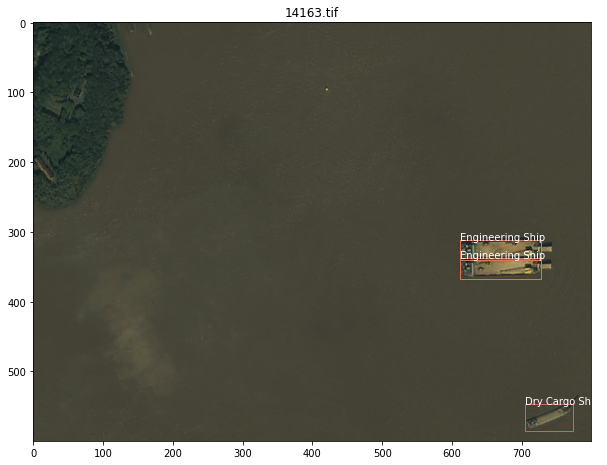

<Figure size 432x288 with 0 Axes>

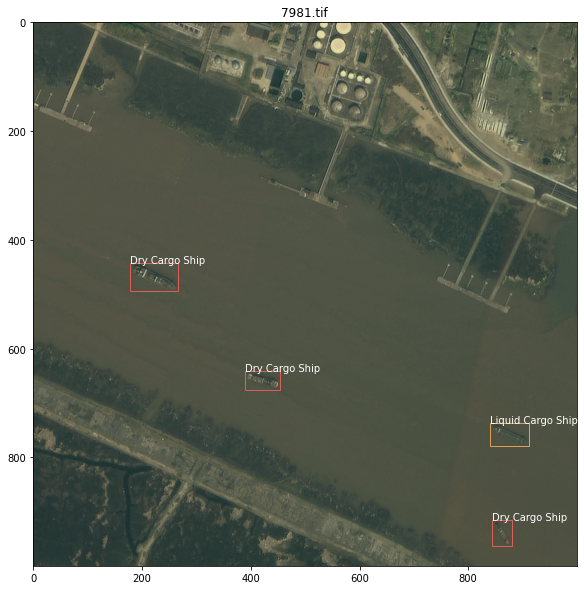

<Figure size 432x288 with 0 Axes>

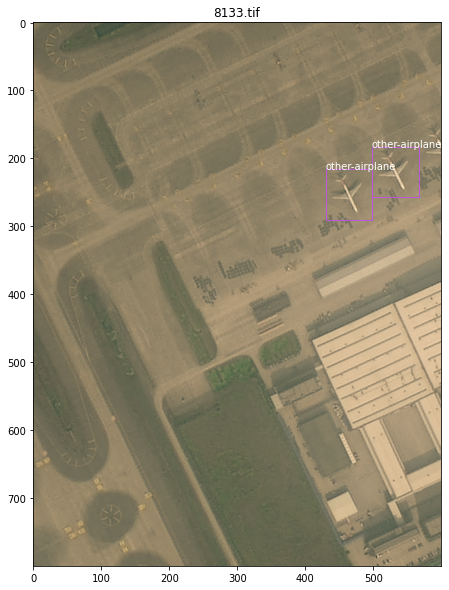

<Figure size 432x288 with 0 Axes>

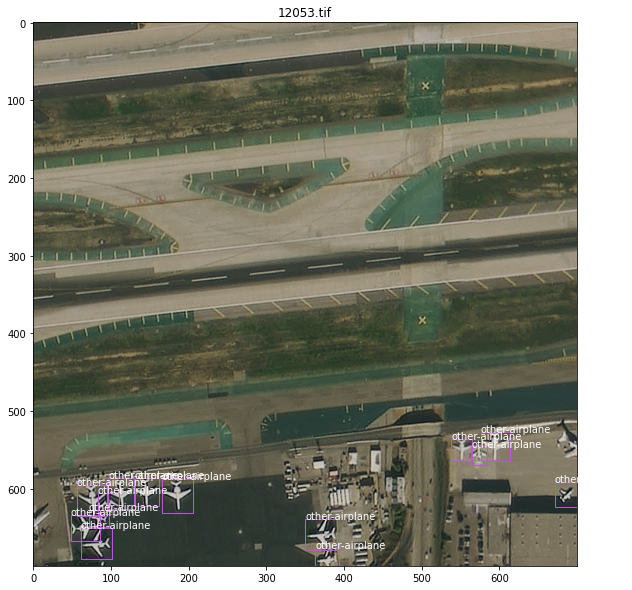

<Figure size 432x288 with 0 Axes>

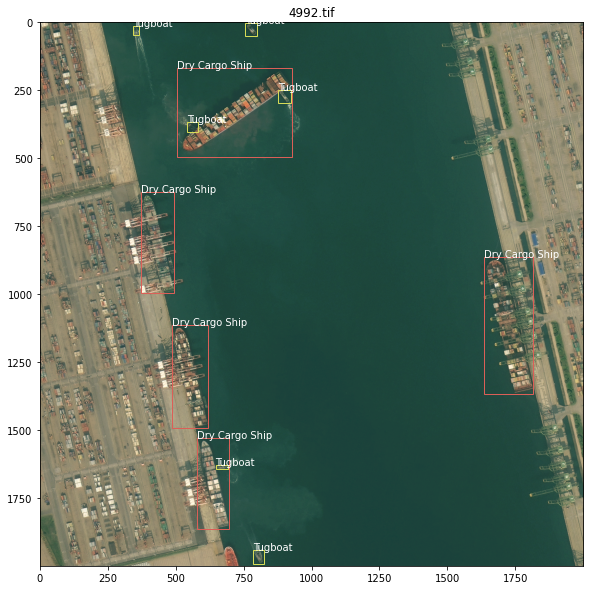

<Figure size 432x288 with 0 Axes>

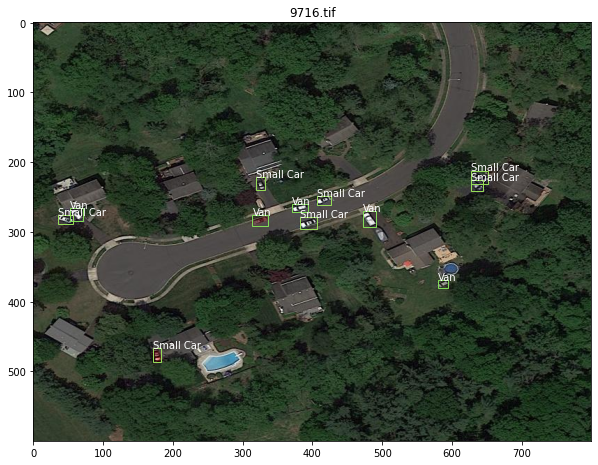

<Figure size 432x288 with 0 Axes>

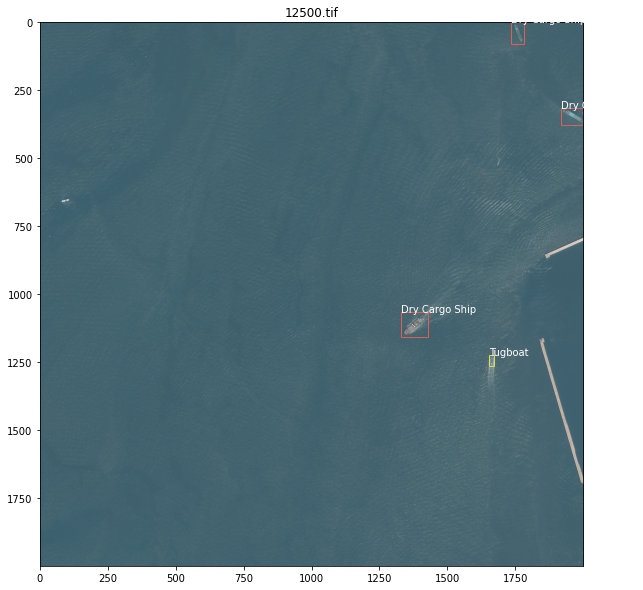

<Figure size 432x288 with 0 Axes>

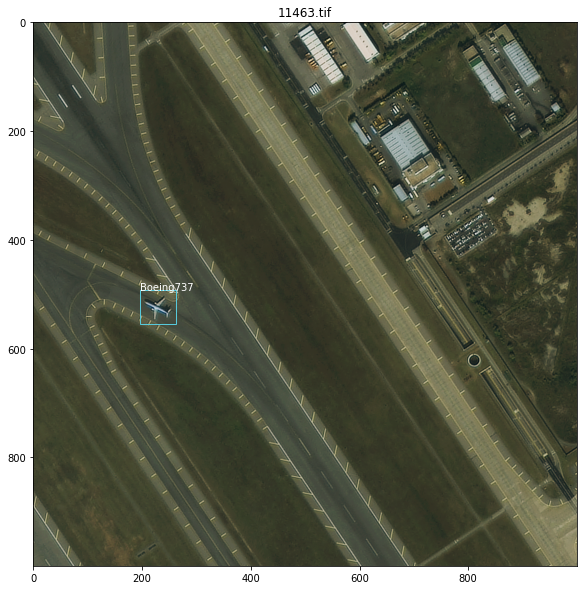

<Figure size 432x288 with 0 Axes>

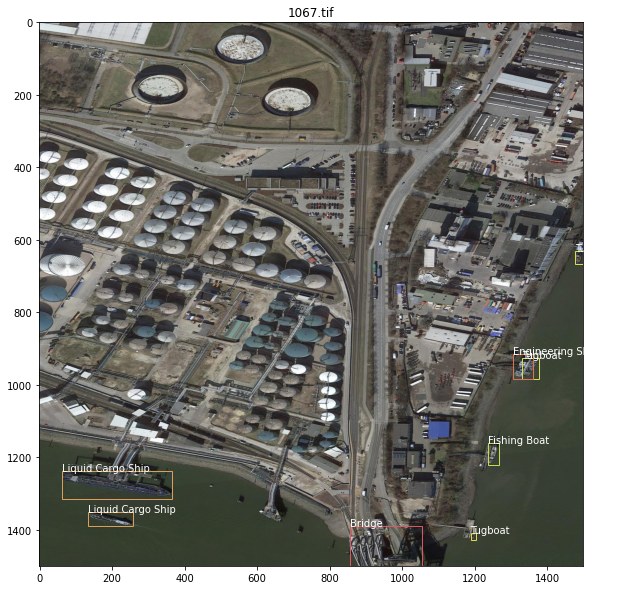

<Figure size 432x288 with 0 Axes>

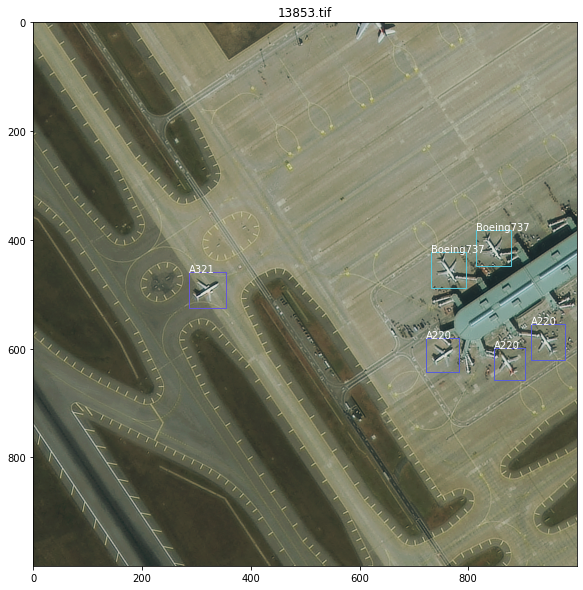

In [ ]:
# sanity check - look over a few sample images to ensure everything matches
images = '/content/ISPRS Benchmark/train/images/'
json_path = '/content/drive/MyDrive/Colab Notebooks/SCHOOL/Final Project/Data/FAIR1M/fair1m_coco.json'
display_random_ims(10, json_path, images, (10,10))

<Figure size 432x288 with 0 Axes>

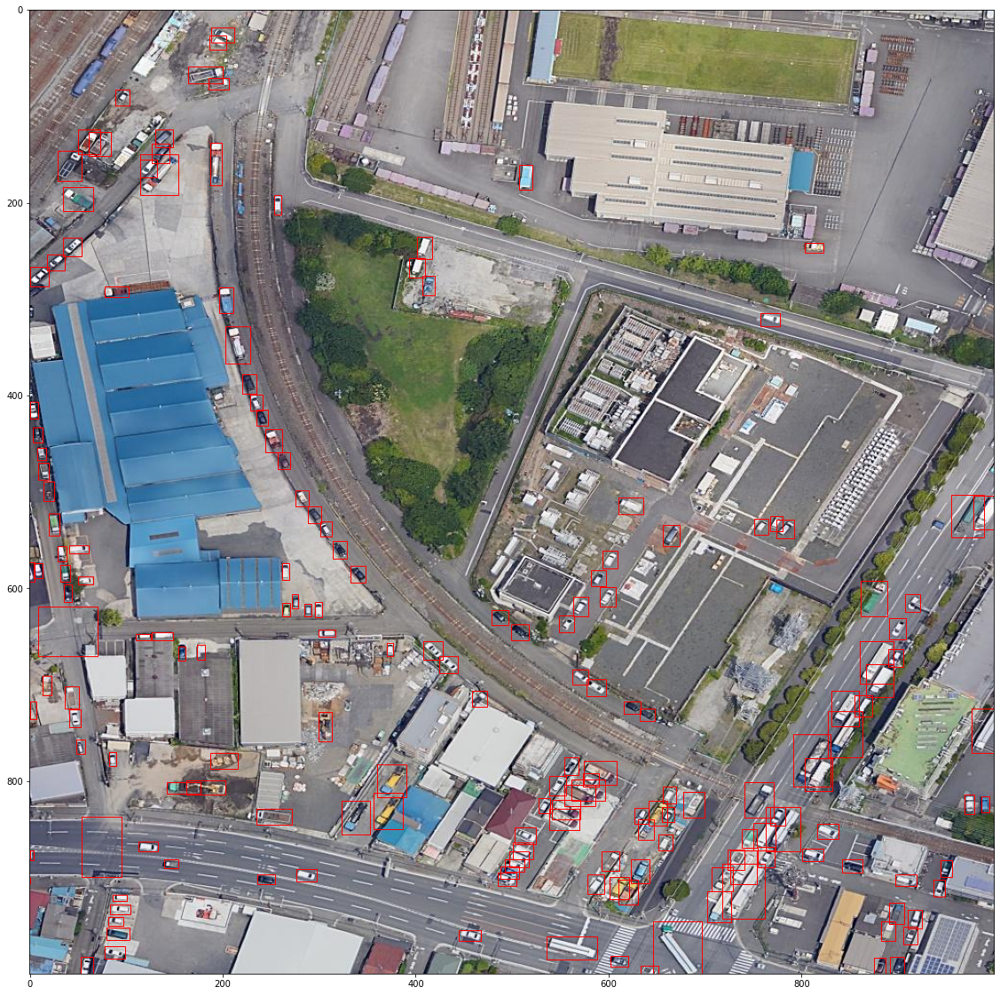

In [ ]:
display_im_anns(419, json_path, images)

In [ ]:
! cp  '/content/fair1m_coco.json' '/content/drive/MyDrive/Colab Notebooks/SCHOOL/Final Project/Data/FAIR1M/'

## Create A Semi Supervised Dataset

In [ ]:
get_category_counts(json_path)

{'A220': 6057,
 'A321': 2505,
 'A330': 1599,
 'A350': 1064,
 'ARJ21': 166,
 'Baseball Field': 1062,
 'Basketball Court': 1271,
 'Boeing737': 3949,
 'Boeing747': 1673,
 'Boeing777': 1532,
 'Boeing787': 1669,
 'Bridge': 1008,
 'Bus': 1022,
 'C919': 135,
 'Cargo Truck': 9257,
 'Dry Cargo Ship': 10860,
 'Dump Truck': 25794,
 'Excavator': 891,
 'Fishing Boat': 5174,
 'Football Field': 853,
 'Intersection': 6368,
 'Liquid Cargo Ship': 2898,
 'Motorboat': 7706,
 'Passenger Ship': 575,
 'Roundabout': 563,
 'Small Car': 143390,
 'Tennis Court': 2924,
 'Tractor': 262,
 'Trailer': 589,
 'Truck Tractor': 923,
 'Tugboat': 1453,
 'Van': 132438,
 'Warship': 599,
 'other-airplane': 9975,
 'other-ship': 2197,
 'other-vehicle': 3065}

In [ ]:
from tqdm import tqdm
import numpy as np

def semi_train_test(base_folder, new_folder, test_p = 30, max_samples = 1000000000):
    '''
    IN:
      - base_folder: folder of images with folder names corresponding to class names
      - new_folder: folder where train and test split will be placed
      - test_p: percentage as integer that should be placed in the test folder
      - max_samples: integer value for the max samples per class. If a class has
                     more examples than this, a random selection up to this number
                     will be used
    OUT: no variables returned, creates train and test folder in new_folder, 
         with image chips renamed to include the class name for use in 
         semi-supervised learning
    '''

    # create new data folder with train and test sub-folders
    if not os.path.exists(new_folder):
        os.mkdir(new_folder)

    train_folder = new_folder + 'train/'
    test_folder = new_folder + 'test/'

    if not os.path.exists(test_folder):
        os.mkdir(train_folder)
        os.mkdir(test_folder)
    
    # get list of class names
    cls_fs = os.listdir(base_folder)

    # process on a class by class basis 
    for cls_fp in tqdm(cls_fs):

        # get a list of images within this class, shuffle them
        fp = base_folder + cls_fp + '/'
        images = os.listdir(fp)
        num_samples = len(images)
        np.random.shuffle(images)

        # if this class is too big, use the maximum number of allowed samples
        if num_samples < max_samples:
            test_index = int((num_samples)*(test_p)/100)
            test_samples = images[:test_index]
            train_samples = images[test_index:]
        # else, split using the provided percentage
        else:
            test_index = int(max_samples*(test_p)/100)
            test_samples = images[:test_index]
            train_samples = images[test_index:max_samples]
        
        # Move the selected images to the correct new folders
        for t in test_samples:
            src = fp + t
            dst = test_folder + f'{cls_fp}_{t}'
            shutil.copy2(src,dst)
        for t in train_samples:
            src = fp + t
            dst = train_folder + f'{cls_fp}_{t}'
            shutil.copy2(src,dst)

    return 

In [ ]:
max_samples = 5000
test_p = 30

base_folder = '/content/fair1m_classification/'
new_folder = f'/content/fair1m_class_semi_testp_{test_p}_max-samples_{max_samples}/'

semi_train_test(base_folder, new_folder, test_p, max_samples)

100%|██████████| 37/37 [01:18<00:00,  2.12s/it]


In [ ]:
! zip -rq '/content/fair1m_class_semi_testp_30_max-samples_5000.zip' '/content/fair1m_class_semi_testp_30_max-samples_5000/' 

In [ ]:
! cp '/content/fair1m_class_semi_testp_30_max-samples_5000.zip' '/content/drive/MyDrive/Colab Notebooks/SCHOOL/Final Project/Data/FAIR1M/'

# 4. Create Classification Dataset

In [ ]:
def anns_on_image(im_id, annotations):
    '''
    IN: 
        - im_id: int id for 'id' in 'images' of coco json
        - json_path: path to coco gt json
    OUT:
        - on_image: list of annotations on the given image
    '''
    
    # Create list of anns on this image
    on_image = []
    for a in annotations:
        if a['image_id'] == im_id:
            on_image.append(a)
    
    return on_image

def get_category_gt(i, categories):
    '''
    IN: 
        -i: int of 'category_id' you would like identified
        -categories: 'categories' section of coco json
    OUT: 
        -name of object category, or "none" if the category isn't present
    '''
    
    for c in categories:
        if c['id'] == i:
            return c['name']
    return "None"

def classification_from_json(json_path, image_folder, classification_folder):

    if not os.path.exists(classification_folder):
        os.mkdir(classification_folder)

    class_counts = {}

    with open(json_path, 'r') as f:
        contents = json.load(f)
    for cat in contents['categories']:
        class_counts[cat['name']] = 0
        class_folder = classification_folder + cat['name'] + '/'
        if not os.path.exists(class_folder):
            os.mkdir(class_folder)

    error_count = 0

    # List images
    images = contents['images']
    annotations = contents['annotations']
    categories = contents['categories']
        
    # Process each image
    for im in tqdm(images):
        i = im['id']
        im_name = im['file_name']
        
        # Get annotations on this image
        anns = anns_on_image(i, annotations)

        a = anns[-1]
        cat = a['category_id']
        cat_name = get_category_gt(cat, categories)
        chip_path = classification_folder + cat_name + '/' + im_name.split('_')[0].split('.')[0] + '_' + str(class_counts[cat_name]) + '.png'
        if not os.path.exists(chip_path):   
            # Read the image
            im_path = image_folder + im_name
            img = plt.imread(im_path)
            for a in anns:
                cat = a['category_id']
                cat_name = get_category_gt(cat, categories)
                chip_path = classification_folder + cat_name + '/' + im_name.split('_')[0].split('.')[0] + '_' + str(class_counts[cat_name]) + '.png'
                class_counts[cat_name] += 1
                if not os.path.exists(chip_path):
                    b = a['bbox']
                    b = [int(a) for a in b]
                    try:
                      chip = img[b[1]:b[1] + b[3], b[0]:b[0]+b[2]]
                      plt.imsave(chip_path, chip)
                    except:
                      error_count += 1
                      continue
        else:
            for a in anns:
                cat = a['category_id']
                cat_name = get_category_gt(cat, categories)
                class_counts[cat_name] += 1
                
    print(f'{error_count} issues during chipping') 
    return

In [ ]:
classification_folder = '/content/fair1m_classification/'
images = '/content/ISPRS Benchmark/train/images/'
classification_from_json(json_path, images, classification_folder)

100%|██████████| 16488/16488 [46:59<00:00,  5.85it/s]


3186 issues during chipping


In [ ]:
# zip up classification as created
! zip -rq '/content/fair1m_classification.zip' '/content/fair1m_classification/'

In [ ]:
# copy resulting data to drive
! cp '/content/fair1m_classification.zip' '/content/drive/MyDrive/Colab Notebooks/SCHOOL/Final Project/Data/FAIR1M/'

## EDA

In [ ]:
def visualize_classes():
    return

In [ ]:
data_folder = '/content/fair1m_classification/'

In [ ]:
examples_per_class = 5
classes = len(os.listdir(data_folder))

sample_im = '/content/fair1m_classification/A220/10001_3726.png'
img = plt.imread(sample_im)

In [ ]:
import numpy as np

i = [1,2,3]
np.random.shuffle(i)
i

[2, 3, 1]

In [ ]:
def rm_bad_ims(fp, printout = False):

  bad_ims = []
  good_ims = []
  for f in os.listdir(fp):
      try:
          img= plt.imread(fp + f)
          good_ims.append(f)
      except:
          os.remove(fp + f)
          bad_ims.append(f)
  if printout:
      try:
          percent = len(bad_ims)/(len(bad_ims)+len(good_ims))
          print(f'Removed {percent} of the images as corrupted: {fp}')
      except:
          print(f'Empty folder: {fp}')

  return

In [ ]:
# remove corrupted(?) images - about 2% of data currently
fp = '/content/fair1m_classification/'
for folder in os.listdir(fp):
    full_fp = fp + folder + '/'
    rm_bad_ims(full_fp, True)

Removed 0.0 of the images as corrupted: /content/fair1m_classification/Baseball Field/
Removed 0.0 of the images as corrupted: /content/fair1m_classification/Bridge/
Removed 0.0 of the images as corrupted: /content/fair1m_classification/A220/
Removed 0.0 of the images as corrupted: /content/fair1m_classification/Boeing777/
Removed 0.0 of the images as corrupted: /content/fair1m_classification/other-vehicle/
Removed 0.0 of the images as corrupted: /content/fair1m_classification/Van/
Removed 0.0 of the images as corrupted: /content/fair1m_classification/other-airplane/
Removed 0.0 of the images as corrupted: /content/fair1m_classification/Passenger Ship/
Removed 0.0 of the images as corrupted: /content/fair1m_classification/Basketball Court/
Removed 0.0 of the images as corrupted: /content/fair1m_classification/Cargo Truck/
Removed 0.0 of the images as corrupted: /content/fair1m_classification/Tractor/
Removed 0.0 of the images as corrupted: /content/fair1m_classification/Boeing737/
Remo

In [ ]:
# create a list of image paths given the file structure
vis_ims = {}
for folder in os.listdir(data_folder):
    fp = data_folder + folder + '/'
    images = os.listdir(fp)
    if len(images) >= examples_per_class and '.ipynb' not in fp:
        images = [fp + i for i in images]
        np.random.shuffle(images)
        vis_ims[folder] = images[:examples_per_class]
    

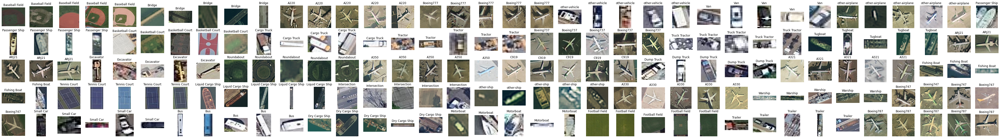

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


columns = len(list(vis_ims.keys()))
rows = examples_per_class

fig = plt.figure(figsize=(classes*2, 10))
# ax enables access to manipulate each of subplots
ax = []

for example in range(rows):
  for cls_num in range(columns):
    
        i = cls_num*rows + example
        
        # create subplot and append to ax
        ax.append(fig.add_subplot(rows, columns, i+1))
        cls_name = list(vis_ims.keys())[cls_num]
        im_path = vis_ims[cls_name][example]

        # print(im_path)

        img = plt.imread(im_path)

        ax[-1].set_title(cls_name)  # set title
        ax[-1].set_axis_off()
        plt.imshow(img)


plt.show()  # finally, render the plot

In [ ]:
with open('/content/fair1m_coco.json', 'r') as f:
    content = json.load(f)
# content['categories']
content['categories']

[{'id': 1, 'name': 'Dry Cargo Ship', 'supercategory': 'Ship'},
 {'id': 1, 'name': 'Engineering Ship', 'supercategory': 'Ship'},
 {'id': 3, 'name': 'Motorboat', 'supercategory': 'Ship'},
 {'id': 4, 'name': 'Liquid Cargo Ship', 'supercategory': 'Ship'},
 {'id': 5, 'name': 'Warship', 'supercategory': 'Ship'},
 {'id': 6, 'name': 'Passenger Ship', 'supercategory': 'Ship'},
 {'id': 7, 'name': 'Tugboat', 'supercategory': 'Ship'},
 {'id': 8, 'name': 'Fishing Boat', 'supercategory': 'Ship'},
 {'id': 9, 'name': 'other-ship', 'supercategory': 'Ship'},
 {'id': 10, 'name': 'Small Car', 'supercategory': 'Vehicle'},
 {'id': 11, 'name': 'Van', 'supercategory': 'Vehicle'},
 {'id': 12, 'name': 'Bus', 'supercategory': 'Vehicle'},
 {'id': 13, 'name': 'Excavator', 'supercategory': 'Vehicle'},
 {'id': 14, 'name': 'Tractor', 'supercategory': 'Vehicle'},
 {'id': 15, 'name': 'Dump Truck', 'supercategory': 'Vehicle'},
 {'id': 16, 'name': 'Cargo Truck', 'supercategory': 'Vehicle'},
 {'id': 17, 'name': 'Truck Tra

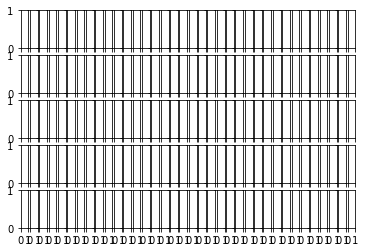

In [ ]:
fig, axs = plt.subplots(nrows = rows, ncols= columns, sharex= True, sharey=True)
plt.show()

In [ ]:
for example in range(rows):
  for cls_num in range(columns):
        i = cls_num*rows + example
        cls_name = list(vis_ims.keys())[cls_num]
        print(cls_name)

Baseball Field
Bridge
A220
Boeing777
other-vehicle
Van
other-airplane
Passenger Ship
Basketball Court
Cargo Truck
Tractor
Boeing737
Truck Tractor
Tugboat
ARJ21
Excavator
Roundabout
A350
C919
Dump Truck
A321
Fishing Boat
Tennis Court
Liquid Cargo Ship
Intersection
other-ship
A330
Warship
Boeing747
Small Car
Bus
Dry Cargo Ship
Motorboat
Football Field
Trailer
Boeing787
Baseball Field
Bridge
A220
Boeing777
other-vehicle
Van
other-airplane
Passenger Ship
Basketball Court
Cargo Truck
Tractor
Boeing737
Truck Tractor
Tugboat
ARJ21
Excavator
Roundabout
A350
C919
Dump Truck
A321
Fishing Boat
Tennis Court
Liquid Cargo Ship
Intersection
other-ship
A330
Warship
Boeing747
Small Car
Bus
Dry Cargo Ship
Motorboat
Football Field
Trailer
Boeing787
Baseball Field
Bridge
A220
Boeing777
other-vehicle
Van
other-airplane
Passenger Ship
Basketball Court
Cargo Truck
Tractor
Boeing737
Truck Tractor
Tugboat
ARJ21
Excavator
Roundabout
A350
C919
Dump Truck
A321
Fishing Boat
Tennis Court
Liquid Cargo Ship
Intersect

# Vehicle Only Dataset

In [ ]:
! cp '/content/drive/MyDrive/Colab Notebooks/SCHOOL/Final Project/Data/FAIR1M/fair1m_class_semi_testp_30_max-samples_5000.zip' .

In [ ]:
! unzip -q '/content/fair1m_class_semi_testp_30_max-samples_5000.zip'

In [ ]:
images = os.listdir('/content/content/fair1m_class_semi_testp_30_max-samples_5000/train/')
im_classes = [i.split('_')[0] for i in images]
im_classes = list(set(im_classes))
im_classes

['Liquid Cargo Ship',
 'Bus',
 'Trailer',
 'ARJ21',
 'Engineering Ship',
 'C919',
 'Dump Truck',
 'Football Field',
 'A350',
 'Truck Tractor',
 'Passenger Ship',
 'other-ship',
 'Cargo Truck',
 'Baseball Field',
 'Motorboat',
 'Boeing777',
 'A321',
 'Boeing747',
 'Boeing787',
 'Roundabout',
 'Bridge',
 'Excavator',
 'Tennis Court',
 'A220',
 'Tugboat',
 'Tractor',
 'Basketball Court',
 'Warship',
 'Van',
 'other-airplane',
 'Boeing737',
 'Small Car',
 'other-vehicle',
 'Fishing Boat',
 'Dry Cargo Ship',
 'Intersection',
 'A330']

In [ ]:
keep_classes = ['Trailer', 'Van', 'Cargo Truck', 'Truck Tractor', 'Dump Truck', 'Bus', 'Small Car']
image_folder = '/content/content/fair1m_class_semi_testp_30_max-samples_5000/'

In [ ]:
for div in os.listdir(image_folder):
    div_path = image_folder + div + '/'
    for i in os.listdir(div_path):
        i_class = i.split('_')[0]
        if i_class not in keep_classes:
            os.remove(div_path + i)

In [ ]:
images = os.listdir('/content/content/fair1m_class_semi_testp_30_max-samples_5000/test/')
im_classes = [i.split('_')[0] for i in images]
im_classes = list(set(im_classes))
im_classes

['Cargo-Truck',
 'Small-Car',
 'Truck-Tractor',
 'Bus',
 'Trailer',
 'Dump-Truck',
 'Van']

In [ ]:
for div in os.listdir(image_folder):
    div_path = image_folder + div + '/'
    for i in os.listdir(div_path):
        dst_i = i.replace(' ','-')
        os.rename(div_path + i, div_path + dst_i)

In [ ]:
! cp '/content/drive/MyDrive/Colab Notebooks/SCHOOL/Final Project/Data/DOTA/sort/semi_vehicles_jason_kristina_sort_test_40.zip' .

! unzip -q '/content/semi_vehicles_jason_kristina_sort_test_40.zip'

In [ ]:
images = os.listdir('/content/content/semi_vehicles_jason_kristina_sort_test_40/train/')
im_classes = [i.split('_')[0] for i in images]
im_classes = list(set(im_classes))
im_classes

['pickup-trucks',
 'truck-tractor',
 'truck-trailor-unloaded',
 'van',
 'small-car',
 'bus',
 'cargo-truck']

In [ ]:
image_folder = '/content/content/semi_vehicles_jason_kristina_sort_test_40/'
keep_classes = ['cargo-truck', 'van', 'truck-tractor', 'truck-trailor-unloaded', 'pickup-trucks', 'small-car', 'bus']

In [ ]:
for div in os.listdir(image_folder):
    div_path = image_folder + div + '/'
    for i in os.listdir(div_path):
        i_class = i.split('_')[0]
        if i_class not in keep_classes:
            os.remove(div_path + i)

In [ ]:
os.rename('/content/content/fair1m_class_semi_testp_30_max-samples_5000', 'fair1m_vehicles_semi_testp_30_max-samples_5000')

In [ ]:
! zip -rq '/content/fair1m_vehicles_semi_testp_30_max-samples_5000.zip' '/content/fair1m_vehicles_semi_testp_30_max-samples_5000'

In [ ]:
! cp 'fair1m_vehicles_semi_testp_30_max-samples_5000.zip' '/content/drive/MyDrive/Colab Notebooks/SCHOOL/Final Project/Data/DOTA-FAIR1M'

In [ ]:
image_folder = '/content/content/semi_vehicles_jason_kristina_sort_test_40/'
dota_rename = {'cargo-truck': 'Cargo-Truck', 'van': 'Van', 'truck-tractor': 'Truck-Tractor', 'truck-trailor-unloaded': 'Trailer', 'pickup-trucks': 'Dump-Truck', 'small-car': 'Small-Car', 'bus': 'Bus'}

In [ ]:
for div in os.listdir(image_folder):
    div_path = image_folder + div + '/'
    for i in os.listdir(div_path):
        i_class = i.split('_')[0]
        dst_i = i.replace(i_class, dota_rename[i_class])
        os.rename(div_path +i, div_path + dst_i)

In [ ]:
images = os.listdir('/content/content/semi_vehicles_jason_kristina_sort_test_40/train/')
im_classes = [i.split('_')[0] for i in images]
im_classes = list(set(im_classes))
im_classes_dota = im_classes.copy()
im_classes_dota

['Cargo-Truck',
 'Bus',
 'Trailer',
 'Truck-Tractor',
 'Van',
 'Dump-Truck',
 'Small-Car']

In [ ]:
images = os.listdir('/content/content/fair1m_class_semi_testp_30_max-samples_5000/train')
im_classes = [i.split('_')[0] for i in images]
im_classes = list(set(im_classes))

im_classes

['Cargo-Truck',
 'Small-Car',
 'Truck-Tractor',
 'Bus',
 'Trailer',
 'Dump-Truck',
 'Van']

In [ ]:
im_classes.sort()
im_classes_dota.sort()
im_classes, im_classes_dota

(['Bus',
  'Cargo-Truck',
  'Dump-Truck',
  'Small-Car',
  'Trailer',
  'Truck-Tractor',
  'Van'],
 ['Bus',
  'Cargo-Truck',
  'Dump-Truck',
  'Small-Car',
  'Trailer',
  'Truck-Tractor',
  'Van'])

In [ ]:
im_classes_dota == im_classes

True

In [ ]:
! zip -rq '/content/content/fair1m_vehicles_semi_testp_30_max-samples_5000.zip' '/content/content/fair1m_class_semi_testp_30_max-samples_5000/'

In [ ]:
! zip -rq '/content/content/dota_vehicles_fair1m_testp_40.zip' '/content/content/semi_vehicles_jason_kristina_sort_test_40'

In [ ]:
! cp '/content/content/dota_vehicles_fair1m_testp_40.zip' '/content/drive/MyDrive/Colab Notebooks/SCHOOL/Final Project/Data/DOTA-FAIR1M'
! cp '/content/content/fair1m_vehicles_semi_testp_30_max-samples_5000.zip' '/content/drive/MyDrive/Colab Notebooks/SCHOOL/Final Project/Data/DOTA-FAIR1M'